# Advanced Lane Finding Project

The goals / steps of this project are the following:

1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
2. Apply a distortion correction to raw images.
3. Use color transforms, gradients, etc., to create a thresholded binary image.
4. Apply a perspective transform to rectify binary image ("birds-eye view").
5. Detect lane pixels and fit to find the lane boundary.
6. Determine the curvature of the lane and vehicle position with respect to center.
7. Warp the detected lane boundaries back onto the original image.
8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

## Import packages

In [1]:
import numpy as np
import cv2
import glob
import pickle
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
%matplotlib qt
%matplotlib inline

## Camera Calibration

In [82]:
# calibration images
imgFiles = glob.glob('./camera_cal/calibration*.jpg')

# number of inside corners for each row and column based on the calibration images
ny, nx = 6, 9 # rows, columns

# prepare object points (x, y, z)
points = np.zeros((ny*nx, 3), np.float32)
points[:,:2] = np.mgrid[:nx,:ny].T.reshape(-1, 2)

# arrays to store object points and image points from all the images.
objpts = [] # 3d points in real world space
imgpts = [] # 2d points in image plane.

# search for chessboard corners
for _, imgFile in enumerate(imgFiles):
    # read image
    img = cv2.imread(imgFile)
    
    # convert image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # find chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    
    # add object/image points if found
    if ret:
        objpts.append(points)
        imgpts.append(corners)

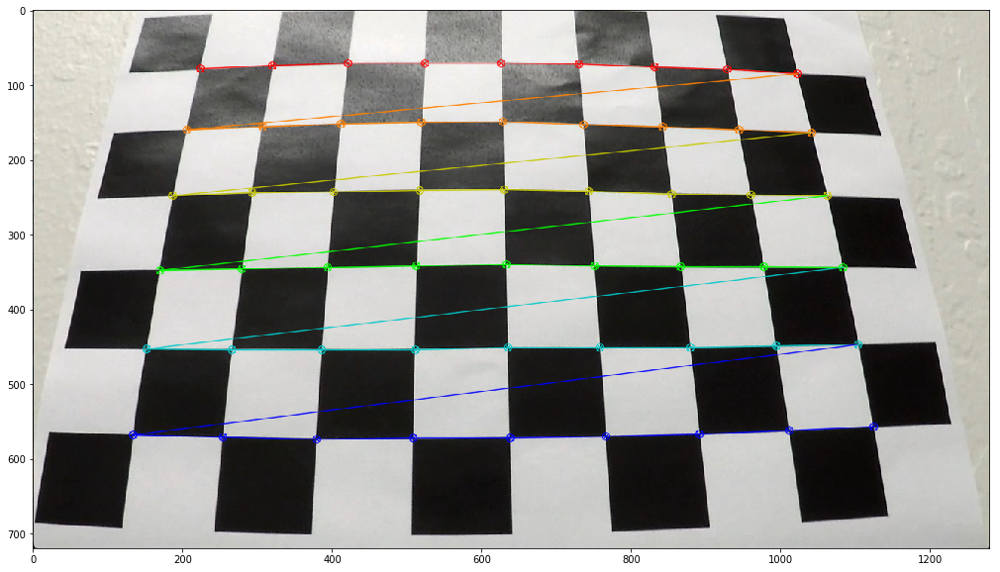

In [85]:
# draw chessboard corners on image
# read an image
testImg = cv2.imread('./camera_cal/calibration3.jpg')

# convert image to grayscale
gray = cv2.cvtColor(testImg, cv2.COLOR_BGR2GRAY)
    
# find chessboard corners
ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

if ret:
    # draw and display the corners
    cv2.drawChessboardCorners(testImg, (nx, ny), corners, ret)

plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(testImg, cv2.COLOR_BGR2RGB))
plt.savefig('./output_images/camera_cal.jpg')

## Apply a distortion correction to raw images

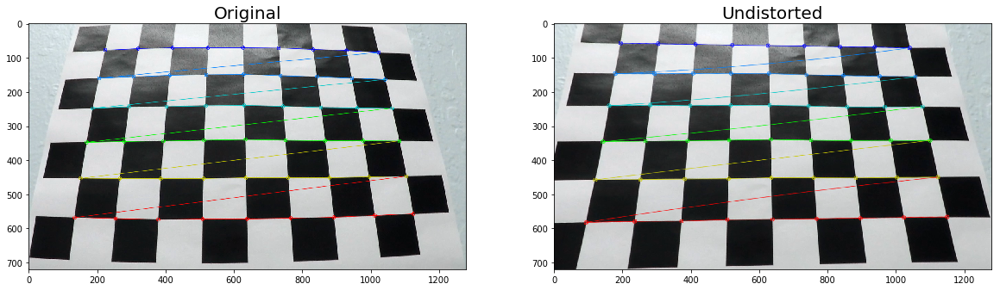

In [52]:
# perform camera calibration given object points and image points
# mtx: camera matrix, dist: distortion coefficients, rves/tvecs: rotation and translation vectors
ret, mtx, dist, rvecs, trevs = cv2.calibrateCamera(objpts, imgpts, testImg.shape[1::-1], None, None)

# undistort the image
undistorted = cv2.undistort(testImg, mtx, dist, None, mtx)

# visualise distortion
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(testImg)
ax1.set_title('Original', fontsize=20)
ax2.imshow(undistorted)
ax2.set_title('Undistorted', fontsize=20)

# save undistorted image output
fig.savefig('./output_images/Undistorted.jpg')

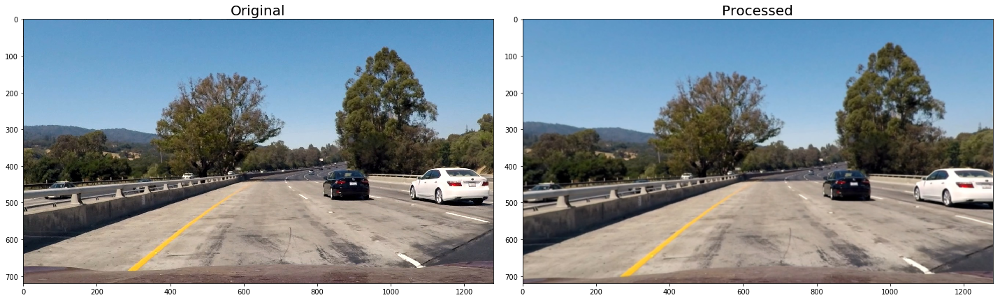

In [81]:
testImgFile = './test_images/test1.jpg'

# read image
img = cv2.imread(testImgFile)

# undistort the image
undistorted = cv2.undistort(blurred, mtx, dist, None, mtx)

f, ax = plt.subplots(1, 2, figsize=(20,10))
f.tight_layout()

# show original and processed image
ax[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax[0].set_title('Original', fontsize=20)
ax[1].imshow(cv2.cvtColor(undistorted, cv2.COLOR_BGR2RGB))
ax[1].set_title('Processed', fontsize=20)

# save undistorted image output
f.savefig('./output_images/Undistorted2.jpg')

In [54]:
# save the camera calibration results for future usages
caliOutput = {}
caliOutput['mtx'] = mtx
caliOutput['dist'] = dist
pickle.dump(caliOutput, open('./camera_cal_dist_output/caliOutput.p', 'wb'))

In [2]:
# load camera calibration results
caliOutput = pickle.load(open('./camera_cal_dist_output/caliOutput.p', 'rb'))
mtx = caliOutput['mtx']
dist = caliOutput['dist']

## Create a thresholded binary image

In [3]:
def gaussian_blur(img, kernel=5):
    return cv2.GaussianBlur(img, (kernel,kernel), 0)

def abs_sobel_thresh(img, orient='x', hsv='all', sobel_kernel=3, thresh=(20, 100)):
    assert hsv.upper() in ('ALL', 'H', 'S', 'V'), 'Invalid input!'
    
    if hsv.upper() == 'ALL':
        # convert image to grayscale
        processedInput = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        # convert to HSV colour space
        hsv_space = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
        
        if hsv.upper() == 'H':
            processedInput = hsv_space[:,:,0]
        elif hsv.upper() == 'S':
            processedInput = hsv_space[:,:,1]
        else:
            processedInput = hsv_space[:,:,2]
    
    # take the derivative in x or y given the orient
    (x, y) = (1, 0) if orient == 'x' else (0, 1)
    sobelXY = cv2.Sobel(processedInput, cv2.CV_64F, x, y, ksize=sobel_kernel)
    
    # take the absolute value of the derivative
    absSobelXY = np.absolute(sobelXY)
    
    # scale to 8-bit (0-255) then convert to np.uint8
    scaled = np.uint(255 * absSobelXY/np.max(absSobelXY))
    
    # create a mask of 1's where the thresholds are met
    binary_output = np.zeros_like(scaled)
    binary_output[(scaled > thresh[0]) & (scaled < thresh[1])] = 1
    
    return binary_output

def mag_thresh(img, sobel_kernel=3, thresh=(30, 100)):
    # convert image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # take the derivative in x and y separately
    sobelX = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobelY = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # calculate the magnitude
    magnitude = np.sqrt(sobelX**2 + sobelY**2)
    
    # scale to 8-bit (0-255) and convert to np.uint8
    scaled = np.uint(255 * magnitude/np.max(magnitude))
    
    # create a mask of 1's where the thresholds are met
    binary_output = np.zeros_like(scaled)
    binary_output[(scaled > thresh[0]) & (scaled < thresh[1])] = 1
    
    return binary_output

def dir_thresh(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # convert image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # take the derivative in x and y separately
    sobelX = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobelY = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # take the absolute value of the x and y gradient
    absSobelX, absSobelY = np.absolute(sobelX), np.absolute(sobelY)
    
    # calculate the direction of the gradient using np.arctan2
    grad_dir = np.arctan2(absSobelY, absSobelX)
    
    # create a mask of 1's where the thresholds are met
    binary_output = np.zeros_like(grad_dir)
    binary_output[(grad_dir > thresh[0]) & (grad_dir < thresh[1])] = 1
    
    return binary_output

def rgb_thresh(img, channel='r', thresh=(150, 255)):
    assert channel.upper() in ('R', 'G', 'B'), 'Invalid channel input! It can only be r, g, or b!'
    
    # apply threshold to the S channel
    if channel.upper() == 'R':
        threshChannel = img[:,:,2]
    elif channel.upper() == 'G':
        threshChannel = img[:,:,1]
    else:
        threshChannel = img[:,:,0]
    
    # create a mask of 1's where the thresholds are met
    binary_output = np.zeros_like(threshChannel)
    binary_output[(threshChannel > thresh[0]) & (threshChannel < thresh[1])] = 1
    
    return binary_output

def lab_thresh(img, channel='b', thresh=(150, 255)):
    assert channel.upper() in ('L', 'A', 'B'), 'Invalid channel input! It can only be l, a, or b!'
    
    # convert image to HLS color space
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)
    
    # apply threshold to the S channel
    if channel.upper() == 'L':
        threshChannel = lab[:,:,0]
    elif channel.upper() == 'A':
        threshChannel = lab[:,:,1]
    else:
        threshChannel = lab[:,:,2]
    
    # create a mask of 1's where the thresholds are met
    binary_output = np.zeros_like(threshChannel)
    binary_output[(threshChannel > thresh[0]) & (threshChannel < thresh[1])] = 1
    
    return binary_output

def hls_thresh(img, channel='s', thresh=(150, 255)):
    assert channel.upper() in ('H', 'L', 'S'), 'Invalid channel input! It can only be h, l, or s!'
    
    # convert image to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    
    # apply threshold to the S channel
    if channel.upper() == 'H':
        threshChannel = hls[:,:,0]
    elif channel.upper() == 'L':
        threshChannel = hls[:,:,1]
    else:
        threshChannel = hls[:,:,2]
    
    # create a mask of 1's where the thresholds are met
    binary_output = np.zeros_like(threshChannel)
    binary_output[(threshChannel > thresh[0]) & (threshChannel < thresh[1])] = 1
    
    return binary_output

In [4]:
def binary_threshold(img, xIn=None, yIn=None, magIn=None, dirIn=None, 
                     rgbInR=None, rgbInG=None, rgbInB=None,
                     hlsInH=None, hlsInL=None, hlsInS=None):
    
    assert (not(xIn is None) or not(yIn is None) or not(magIn is None) or not(dirIn is None) \
            or not(rgbInR is None) or not(rgbInG is None) or not(rgbInB is None) or not() \
            or not(hlsInH is None) or not(hlsInL is None) or not(hlsInS is None) or not()), 'Invalid Input!'
    
    xOut, yOut, magOut, dirOut = False, False, False, False
    rgbOutR, rgbOutG, rgbOutB = False, False, False
    hlsOutH, hlsOutL, hlsOutS = False, False, False
    
    combined = None
    
    if xIn:
        x_binary = abs_sobel_thresh(img, hsv=xIn[0], orient='x', sobel_kernel=xIn[1], thresh=xIn[2])
        xOut = (x_binary == 1)
        if (combined is None):
            combined = np.zeros_like(x_binary)
    
    if yIn:
        y_binary = abs_sobel_thresh(img, hsv=xIn[0], orient='y', sobel_kernel=xIn[1], thresh=xIn[2])
        yOut = (y_binary == 1)
        if (combined is None):
            combined = np.zeros_like(y_binary)
        
    if magIn:
        mag_binary = mag_thresh(img, sobel_kernel=magIn[0], thresh=magIn[1])
        magOut = (mag_binary == 1)
        if (combined is None):
            combined = np.zeros_like(mag_binary)
    
    if dirIn:
        dir_binary = dir_thresh(img, sobel_kernel=dirIn[0], thresh=dirIn[1])
        dirOut = (dir_binary == 1)
        if (combined is None):
            combined = np.zeros_like(dir_binary)

    if hlsInH:
        hls_binary = hls_thresh(img, channel='h', thresh=hlsInH)
        hlsOutH = (hls_binary == 1)
        if (combined is None):
            combined = np.zeros_like(hls_binary)            
            
    if hlsInL:
        hls_binary = hls_thresh(img, channel='l', thresh=hlsInL)
        hlsOutL = (hls_binary == 1)
        if (combined is None):
            combined = np.zeros_like(hls_binary)            
            
    if hlsInS:
        hls_binary = hls_thresh(img, channel='s', thresh=hlsInS)
        hlsOutS = (hls_binary == 1)
        if (combined is None):
            combined = np.zeros_like(hls_binary)
        
    if rgbInR:
        rgb_binary = rgb_thresh(img, channel='r', thresh=rgbInR)
        rgbOutR = (rgb_binary == 1)
        if (combined is None):
            combined = np.zeros_like(rgb_binary)            
            
    if rgbInG:
        rgb_binary = rgb_thresh(img, channel='g', thresh=rgbInG)
        rgbOutG = (rgb_binary == 1)
        if (combined is None):
            combined = np.zeros_like(rgb_binary)

    if rgbInB:
        rgb_binary = rgb_thresh(img, channel='b', thresh=rgbInB)
        rgbOutB = (rgb_binary == 1)
        if (combined is None):
            combined = np.zeros_like(rgb_binary)            
        
    # combine all binary thresholds together
    combo_one = (xOut & yOut) if (not(isinstance(xOut, bool)) and not(isinstance(yOut,bool))) else (xOut | yOut)
    combo_two = (magOut & dirOut) if (not(isinstance(magOut, bool)) and not(isinstance(dirOut,bool))) \
        else (magOut | dirOut)
    combined[combo_one | combo_two | hlsOutH | hlsOutL | hlsOutS | rgbOutR | rgbOutG | rgbOutB] = 1
    
    return combined

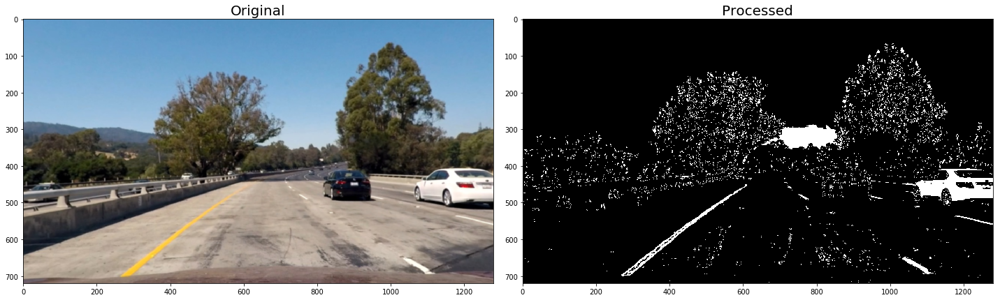

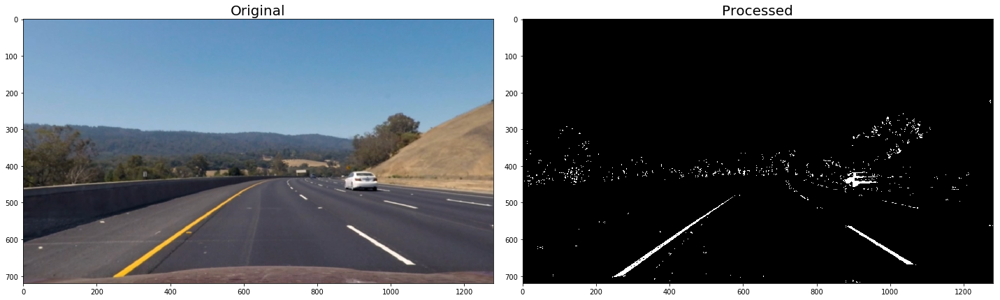

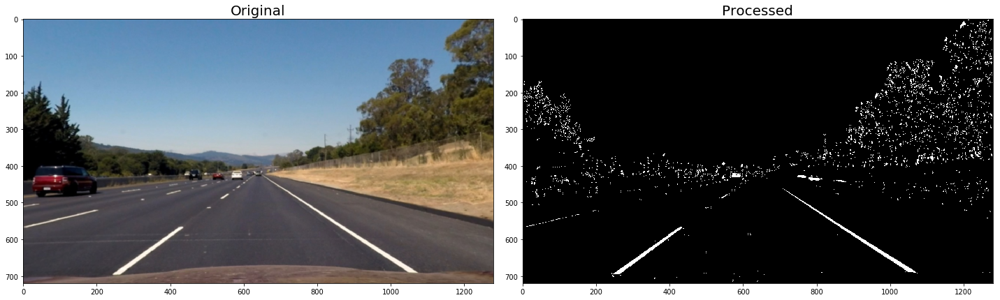

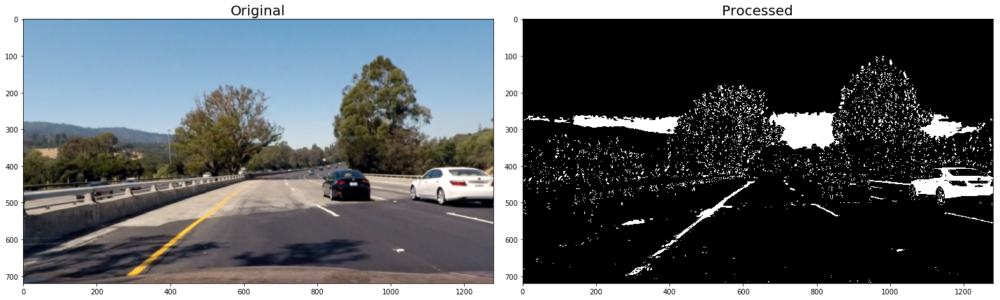

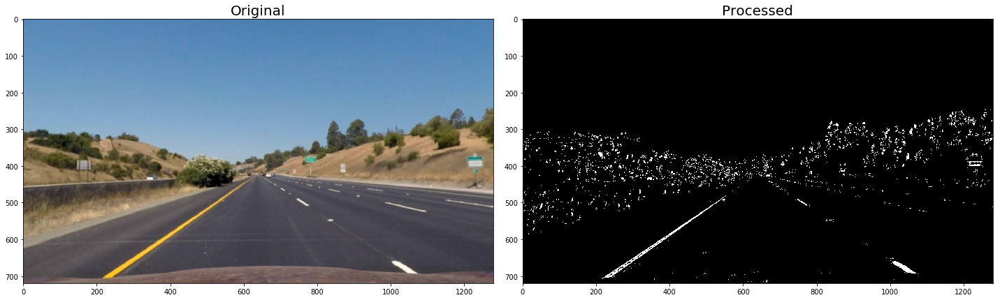

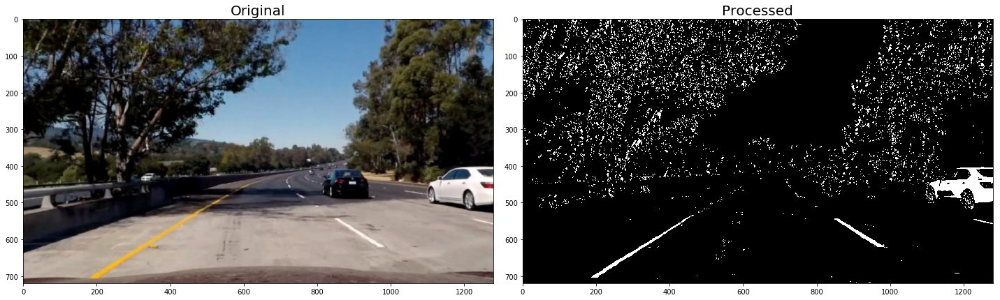

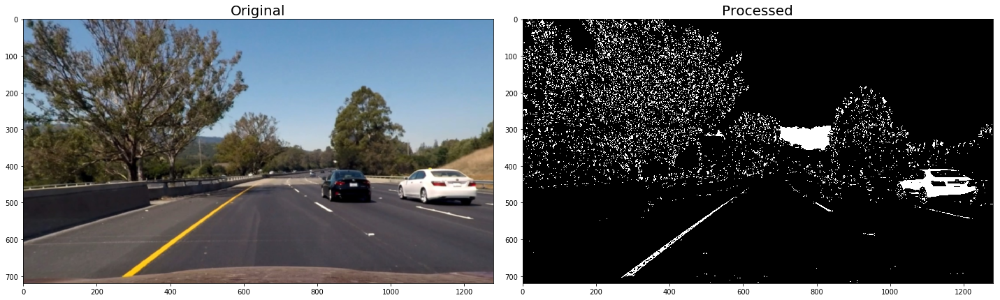

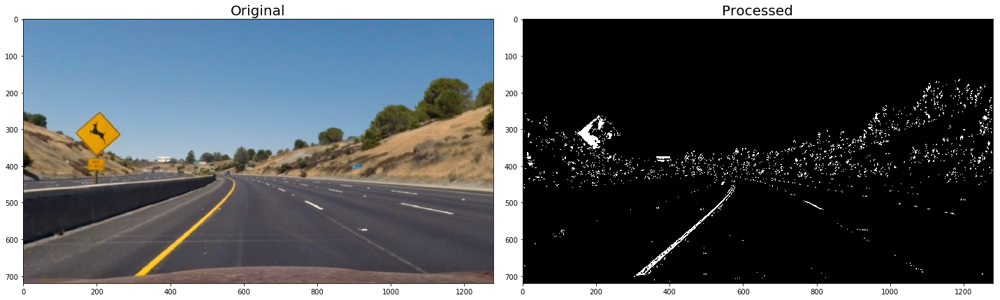

In [23]:
testImgFiles = glob.glob('./test_images/*.jpg')

for _, testImgFile in enumerate(testImgFiles):
    # read image
    img = cv2.imread(testImgFile)
    
    # reduce noise in the original image
    blurred = gaussian_blur(img)
    
    # undistort the image
    undistorted = cv2.undistort(blurred, mtx, dist, None, mtx)
    
    # apply a binary threshold pipeline to the image
    processed = binary_threshold(undistorted, 
                                 magIn=(5, (20, 90)), 
                                 dirIn=(15, (0.3, 0.7)),
                                 rgbInR=(225, 255), 
                                 hlsInL=(200, 255))
    
    f, ax = plt.subplots(1, 2, figsize=(20,10))
    f.tight_layout()
    
    # show original and processed image
    ax[0].imshow(cv2.cvtColor(undistorted, cv2.COLOR_BGR2RGB))
    ax[0].set_title('Original', fontsize=20)
    ax[1].imshow(processed, cmap='gray')
    ax[1].set_title('Processed', fontsize=20)

## Apply a perspective transform to rectify binary image ("birds-eye view")

In [5]:
def warp(img,
         src=np.float32([[568, 468], [715, 468], [1040, 680], [270, 680]]),
         dst=np.float32([[200, 0], [1000, 0], [1000, 680], [200, 680]])):
    
    # reduce noise in the original image
    blurred = gaussian_blur(img)
    
    # calculate perspective transform matrix using source and destination points
    M = cv2.getPerspectiveTransform(src, dst)
    
    # inverse perspective transform
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    # warp the image
    imgWarped = cv2.warpPerspective(blurred, M, blurred.shape[1::-1], flags=cv2.INTER_LINEAR)
    
    # Draw a rectangle with red line borders of thickness of 2 px 
    imgWarped = cv2.rectangle(imgWarped, (dst[3][0], dst[3][1]), (dst[1][0], dst[1][1]), (0, 0, 255), 2) 
    
    return imgWarped, M, Minv

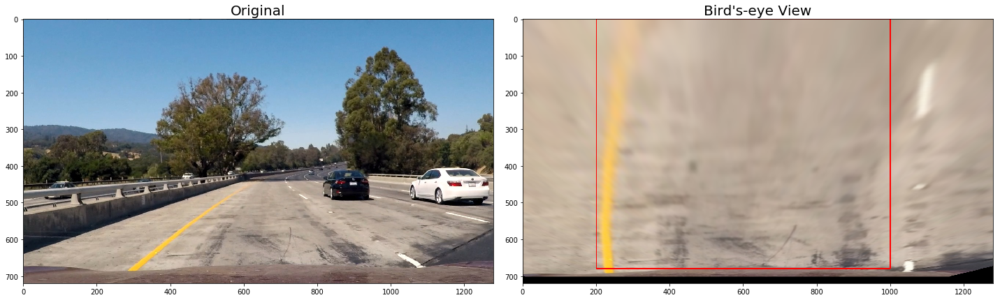

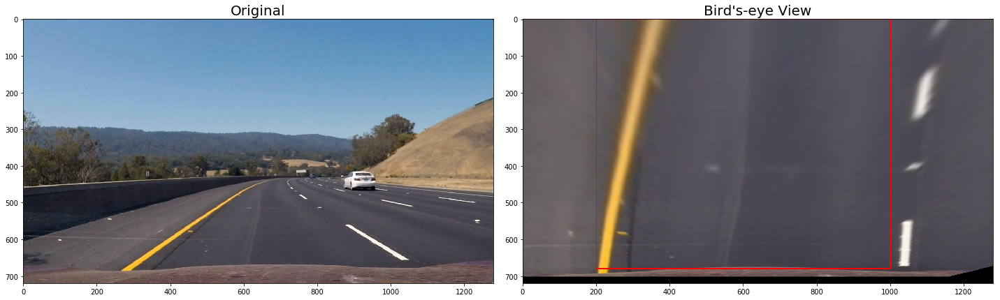

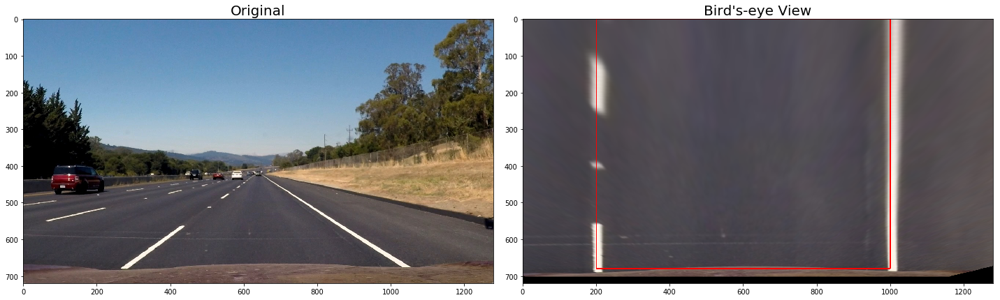

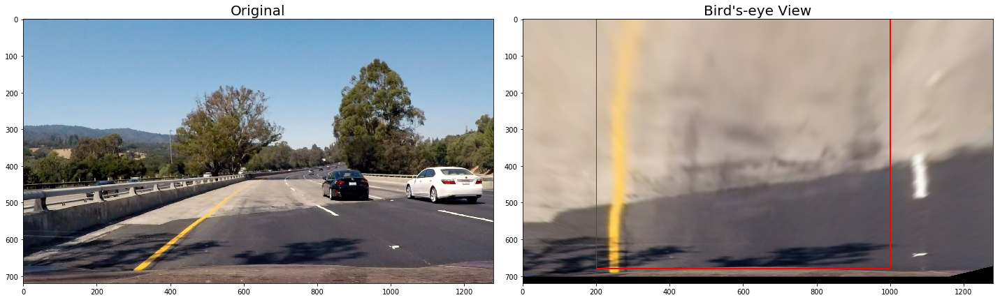

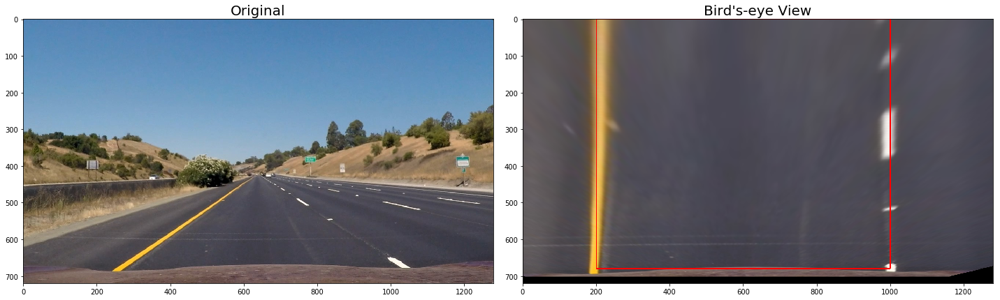

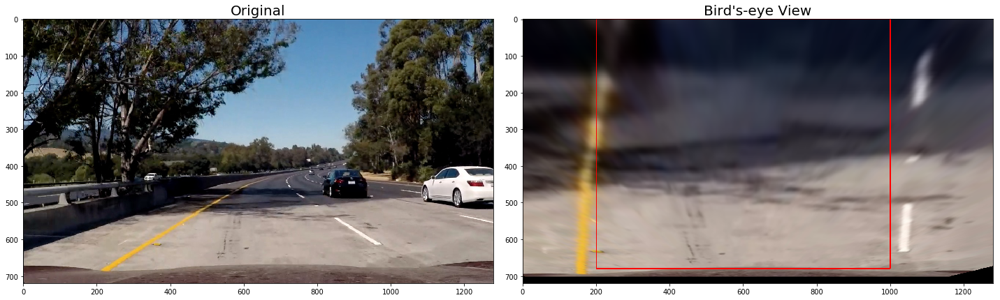

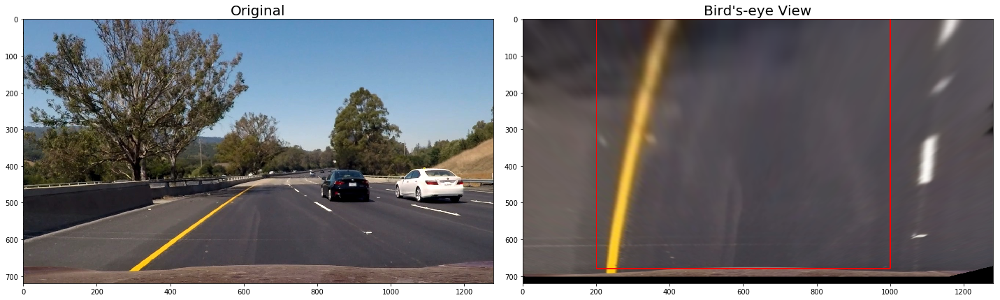

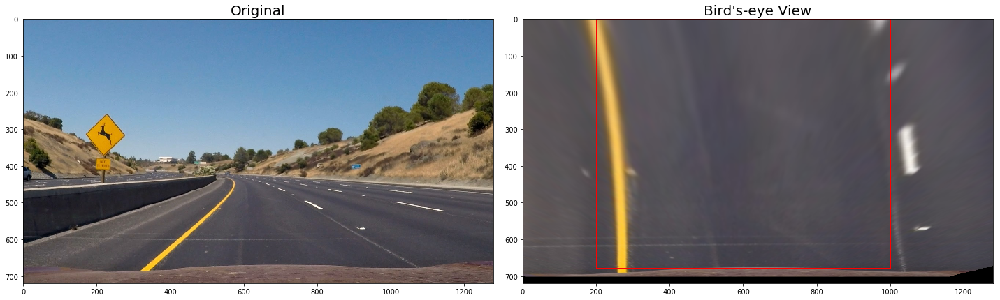

In [106]:
testImgFiles = glob.glob('./test_images/*.jpg')

for _, testImgFile in enumerate(testImgFiles):
    img = cv2.imread(testImgFile)
    
    # undistort image
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    
    # bird's eye view
    birdEye, _, _ = warp(undistorted)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original', fontsize=20)
    ax2.imshow(cv2.cvtColor(birdEye, cv2.COLOR_BGR2RGB))
    ax2.set_title('Bird\'s-eye View', fontsize=20)

In [16]:
f.savefig('./output_images/birds_eye.jpg')

## Detect lane pixels and fit to find the lane boundary

In [6]:
# find lane pixels using sliding window method
def find_lane_pixels(binaryWarpedImg, nWindows=9, margin=80, minpix=50, visualise=True):
    # take a histogram of the bottom half of the image
    histogram = np.sum(binaryWarpedImg[binaryWarpedImg.shape[0]//2:,:], axis=0)
    
    if visualise:
        # create output image to visualise the result
        outImg = np.uint8(np.dstack((binaryWarpedImg, binaryWarpedImg, binaryWarpedImg))*255)
    
    # find left and right peaks of the histogram
    midPoint = np.int(histogram.shape[0]//2)
    leftXBot = np.argmax(histogram[:midPoint])
    rightXBot = np.argmax(histogram[midPoint:]) + midPoint
    
    # set the height of windows based on nWindows and shape of image
    wHeight = np.int(binaryWarpedImg.shape[0]//nWindows)
    
    # identify the (x, y) positions of all non-zero pixels in the image
    nonzero = binaryWarpedImg.nonzero()
    nonzeroX = np.array(nonzero[1])
    nonzeroY = np.array(nonzero[0])
    
    # current positions to be updated later for each window
    leftXCurrent = leftXBot
    rightXCurrent = rightXBot
    
    # store left/right lane pixel indices
    leftLaneInd = []
    rightLaneInd = []
    
    # step through each window
    for w in range(nWindows):
        # identify window boundaries
        winYLo = binaryWarpedImg.shape[0] - (w + 1)*wHeight
        winYHi = binaryWarpedImg.shape[0] - w*wHeight
        winLeftXLo = leftXCurrent - margin
        winLeftXHi = leftXCurrent + margin
        winRightXLo = rightXCurrent - margin
        winRightXHi = rightXCurrent + margin
        
        if visualise:
            # draw the windows on the output image
            cv2.rectangle(outImg, (winLeftXLo, winYLo), (winLeftXHi, winYHi), (0, 255, 0), 2)
            cv2.rectangle(outImg, (winRightXLo, winYLo), (winRightXHi, winYHi), (0, 255, 0), 2)
        
        # identify the nonzero (x, y) pixels within the window
        leftInd = ((nonzeroY >= winYLo) 
                   & (nonzeroY < winYHi) 
                   & (nonzeroX >= winLeftXLo) 
                   & (nonzeroX < winLeftXHi)).nonzero()[0]
        
        rightInd = ((nonzeroY >= winYLo) 
                    & (nonzeroY < winYHi) 
                    & (nonzeroX >= winRightXLo)
                    & (nonzeroX < winRightXHi)).nonzero()[0]
        
        # append the good indices to the list
        leftLaneInd.append(leftInd)
        rightLaneInd.append(rightInd)
        
        # recenter the next window if more than minpix pixels were found
        if len(leftInd) > minpix:
            leftXCurrent = np.int(np.mean(nonzeroX[leftInd]))
        
        if len(rightInd) > minpix:
            rightXCurrent = np.int(np.mean(nonzeroX[rightInd]))
            
    # concatenate the arrays of indices
    leftLaneInd = np.concatenate(leftLaneInd)
    rightLaneInd = np.concatenate(rightLaneInd)
    
    # extract left and right line pixel positions
    leftX = nonzeroX[leftLaneInd]
    leftY = nonzeroY[leftLaneInd]
    rightX = nonzeroX[rightLaneInd]
    rightY = nonzeroY[rightLaneInd]
    
    # fit polynomial
    leftLane, rightLane, leftLaneX, rightLaneX, plotY = fit_polynomial(binaryWarpedImg, 
                                                                       leftX, leftY, rightX, rightY)
    
    if visualise:
        # colors in the left and right lane regions
        outImg[leftY, leftX] = [255, 0, 0]
        outImg[rightY, rightX] = [0, 0, 255]

        # plot the left and right polynomials on the lane lines
        plt.figure(figsize=(10,10))
        plt.plot(leftLaneX, plotY, color='yellow')
        plt.plot(rightLaneX, plotY, color='yellow')
        
        return leftLane, rightLane, leftLaneX, rightLaneX, outImg
    
    return leftLane, rightLane, leftLaneX, rightLaneX

def fit_polynomial(binaryWarpedImg, leftX, leftY, rightX, rightY):
    # fit a 2nd degree polynomial to each lane
    leftLane = np.polyfit(leftY, leftX, 2)
    rightLane = np.polyfit(rightY, rightX, 2)
    
    # generate (x, y) values for plotting
    plotY = np.linspace(0, binaryWarpedImg.shape[0] - 1, binaryWarpedImg.shape[0])
    try:
        leftLaneX = leftLane[0]*plotY**2 + leftLane[1]*plotY + leftLane[2]
        rightLaneX = rightLane[0]*plotY**2 + rightLane[1]*plotY + rightLane[2]
    except TypeError:
        print('Failed to fit a line!')
        leftLaneX = 1*plotY**2 + 1*plotY
        rightLaneX = 1*plotY**2 + 1*plotY
    
    return leftLane, rightLane, leftLaneX, rightLaneX, plotY

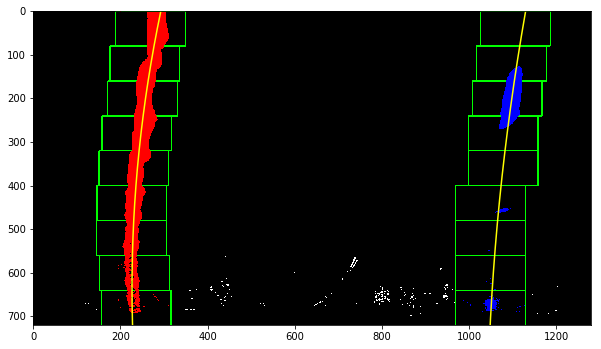

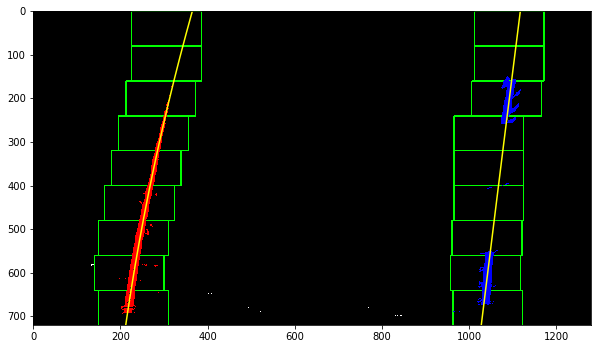

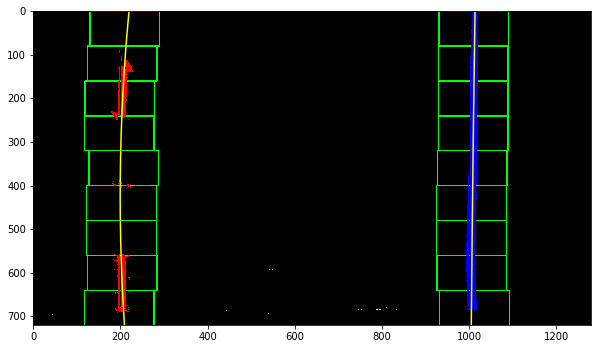

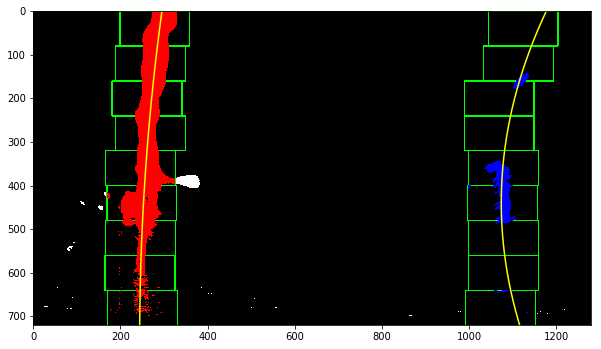

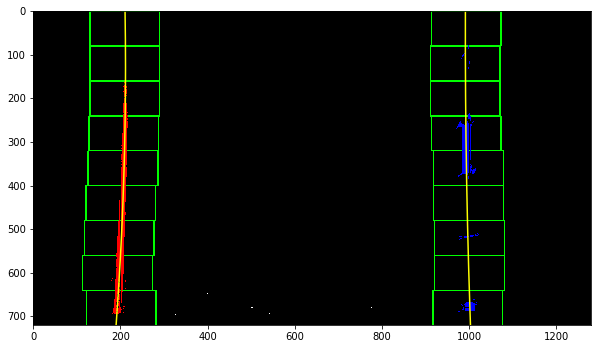

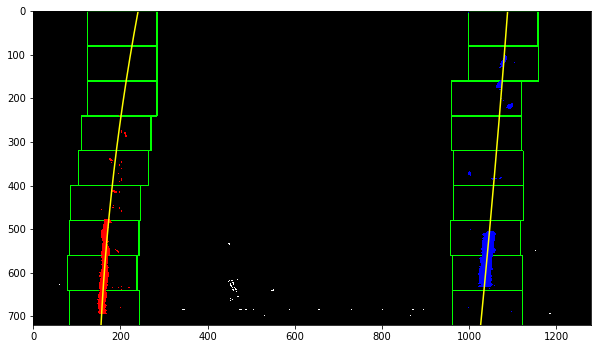

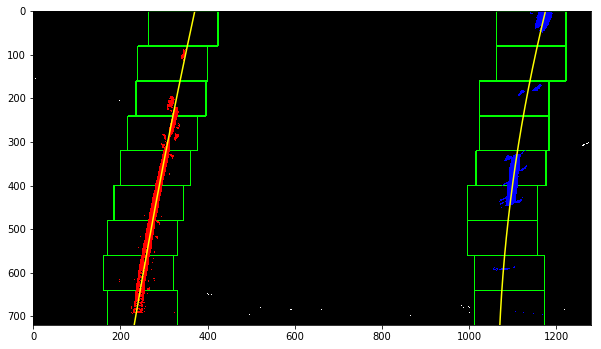

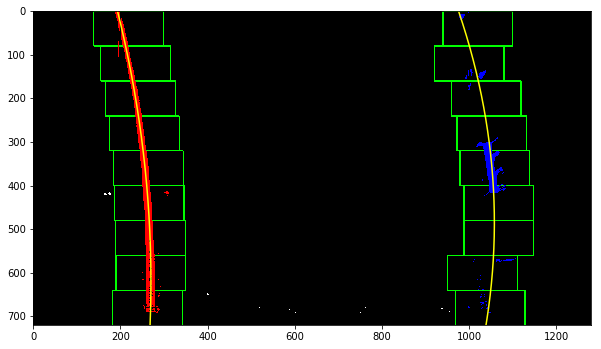

In [109]:
testImgFiles = glob.glob('./test_images/*.jpg')

for _, testImgFile in enumerate(testImgFiles):
    img = cv2.imread(testImgFile)
    
    # undistort image
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    
    # bird's eye view
    birdEye, _, _ = warp(undistorted)
    
    # binary threshold
    birdEyeProcessed = binary_threshold(birdEye, 
                                        magIn=(5, (20, 90)), 
                                        dirIn=(15, (0.3, 0.7)),
                                        rgbInR=(225, 255), 
                                        hlsInL=(200, 255))
    
    # find lanes and approximate 2nd degree polynomial
    leftLane, rightLane, leftLaneX, rightLaneX, outImg = find_lane_pixels(birdEyeProcessed)
    
    plt.imshow(outImg)

In [7]:
def search_around_poly(binaryWarpedImg, prevLanes=None, margin=100, visualise=True):
    if prevLanes is None:
        return find_lane_pixels(binaryWarpedImg, visualise=visualise)
    else:
        leftLane = prevLanes[0]
        rightLane = prevLanes[1]
        
        # identify activated pixels
        nonzero = binaryWarpedImg.nonzero()
        nonzeroX = np.array(nonzero[1])
        nonzeroY = np.array(nonzero[0])
        
        # set the area of the search based on previous detected lanes
        leftLaneInd = ((nonzeroX > (leftLane[0]*(nonzeroY**2) + leftLane[1]*nonzeroY + leftLane[2] - margin)) 
                   & (nonzeroX < (leftLane[0]*(nonzeroY**2) + leftLane[1]*nonzeroY + leftLane[2] + margin)))
        
        rightLaneInd = ((nonzeroX > (rightLane[0]*(nonzeroY**2) + rightLane[1]*nonzeroY + rightLane[2] - margin)) 
                   & (nonzeroX < (rightLane[0]*(nonzeroY**2) + rightLane[1]*nonzeroY + rightLane[2] + margin)))
        
        # extract left and right line pixel positions
        leftX = nonzeroX[leftLaneInd]
        leftY = nonzeroY[leftLaneInd]
        rightX = nonzeroX[rightLaneInd]
        rightY = nonzeroY[rightLaneInd]
        
        if (leftX.size == 0 or rightX.size == 0):
            return find_lane_pixels(binaryWarpedImg, visualise=visualise)
            
        # fit new polynomials
        leftLane, rightLane, leftLaneX, rightLaneX, plotY = fit_polynomial(binaryWarpedImg, 
                                                                           leftX, leftY, rightX, rightY)
        
        if visualise:
            # create output image to visualise the result and another image to show the selected window
            outImg = np.uint8(np.dstack((binaryWarpedImg, binaryWarpedImg, binaryWarpedImg))*255)
            wImg = np.zeros_like(outImg)
            
            # colors in the left and right lane regions
            outImg[leftY, leftX] = [255, 0, 0]
            outImg[rightY, rightX] = [0, 0, 255]
            
            # generate a polygon to illustrate the search window area
            # recast (x, y) points into useable format for cv2.fillPoly()
            leftLaneW1 = np.array([np.transpose(np.vstack([leftLaneX - margin, plotY]))])
            leftLaneW2 = np.array([np.flipud(np.transpose(np.vstack([leftLaneX + margin, plotY])))])
            leftLanePts = np.hstack((leftLaneW1, leftLaneW2))
            
            rightLaneW1 = np.array([np.transpose(np.vstack([rightLaneX - margin, plotY]))])
            rightLaneW2 = np.array([np.flipud(np.transpose(np.vstack([rightLaneX + margin, plotY])))])
            rightLanePts = np.hstack((rightLaneW1, rightLaneW2))
            
            # draw the lane onto the warped blank image
            cv2.fillPoly(wImg, np.int_([leftLanePts]), (0, 255, 0))
            cv2.fillPoly(wImg, np.int_([rightLanePts]), (0, 255, 0))
            result = cv2.addWeighted(outImg, 1, wImg, 0.3, 0)
            
            # plot the left and right polynomials on the lane lines
            plt.figure(figsize=(10,10))
            plt.plot(leftLaneX, plotY, color='yellow')
            plt.plot(rightLaneX, plotY, color='yellow')
            
            return leftLane, rightLane, leftLaneX, rightLaneX, result
        
        return leftLane, rightLane, leftLaneX, rightLaneX

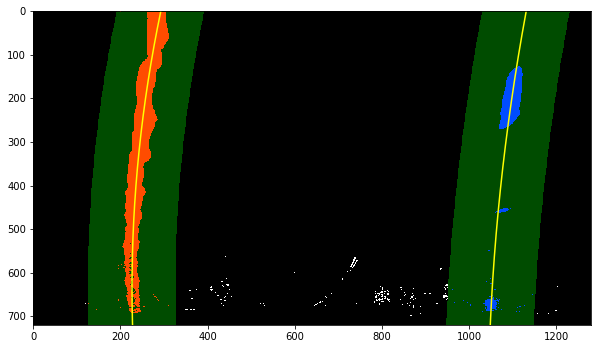

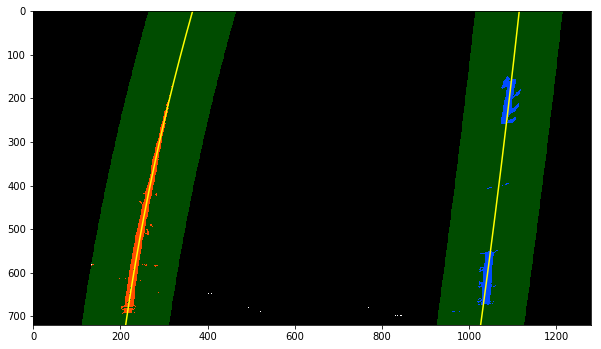

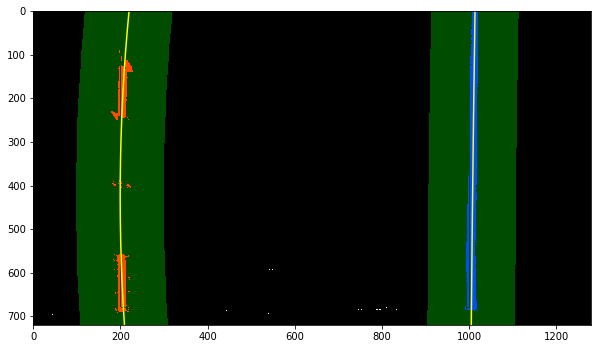

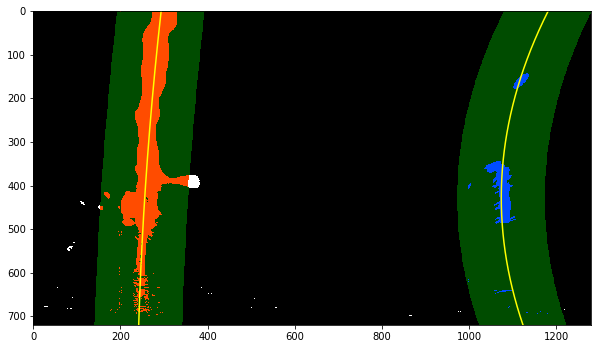

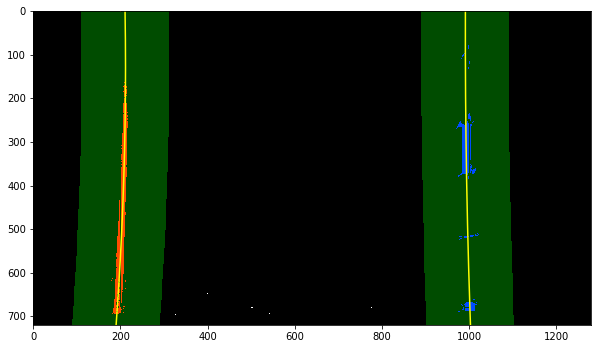

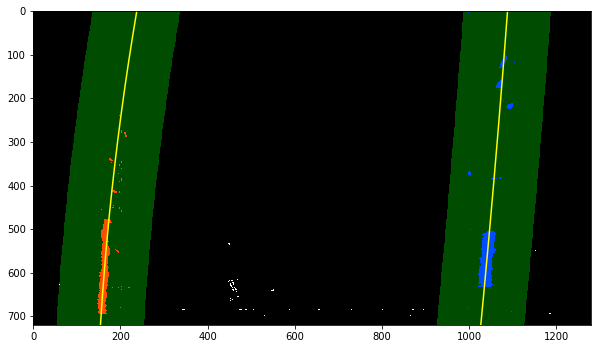

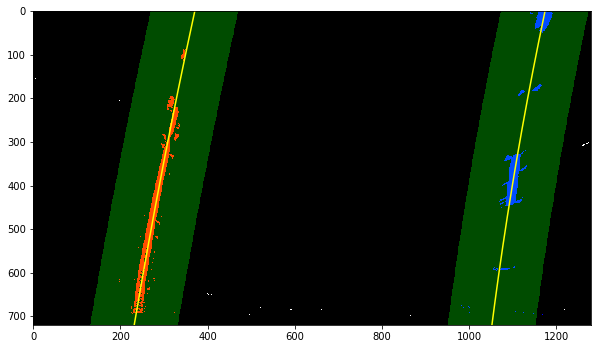

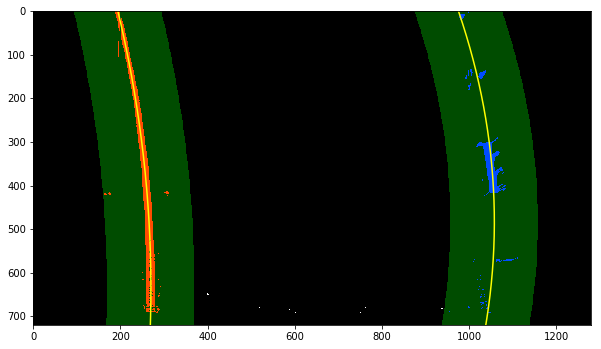

In [26]:
testImgFiles = glob.glob('./test_images/*.jpg')

for _, testImgFile in enumerate(testImgFiles):
    img = cv2.imread(testImgFile)
    
    # undistort image
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    
    # bird's eye view
    birdEye, _, _ = warp(undistorted)
    birdEyeProcessed = binary_threshold(birdEye,
                                        magIn=(5, (20, 90)), 
                                        dirIn=(15, (0.3, 0.7)),
                                        rgbInR=(225, 255), 
                                        hlsInL=(200, 255))
    
    # find lanes and approximate 2nd degree polynomial
    leftLane, rightLane, _, _ = find_lane_pixels(birdEyeProcessed, visualise=False)
    
    # assume next frame is the same as the previous frame
    nextImg = birdEyeProcessed.copy()
    _, _, _, _, outImg = search_around_poly(nextImg, prevLanes=(leftLane, rightLane), margin=100)
    
    plt.imshow(outImg)

In [27]:
cv2.imwrite('./output_images/colour_fit_lines.jpg', outImg)

True

## Determine the curvature of the lane and vehicle position with respect to the centre

In [8]:
def measure_stats(leftLaneX, rightLaneX, img, xm_per_pix=3.7/700, ym_per_pix=30.0/720):
    # reverse points to match top-to-bottom in y
    leftLaneXReversed = leftLaneX[::-1]
    rightLaneXReversed = rightLaneX[::-1]
    
    plotY = np.linspace(0, img.shape[0]-1, img.shape[0])
    
    # fit polynomials in world space
    leftLane = np.polyfit(plotY * ym_per_pix, leftLaneXReversed * xm_per_pix, 2)
    rightLane = np.polyfit(plotY * ym_per_pix, rightLaneXReversed * xm_per_pix, 2)
    
    # define y to calculate radius of curvature
    y = np.max(plotY)
    
    # calculate radius of curvature for left and right lane
    leftCurveRadius = (1 + (2*leftLane[0]*y*ym_per_pix + leftLane[1])**2)**(3/2) / np.absolute(2*leftLane[0])
    rightCurveRadius = (1 + (2*rightLane[0]*y*ym_per_pix + rightLane[1])**2)**(3/2) / np.absolute(2*rightLane[0])
    
    # centre of the image
    centreLine = img.shape[1]/2
        
    # calculate vehicle position from the centre of the image
    leftPos = leftLane[0]*img.shape[0]**2 + leftLane[1]*img.shape[0] + leftLane[2]
    rightPos = rightLane[0]*img.shape[0]**2 + rightLane[1]*img.shape[0] + rightLane[2]
    vehiclePos = (leftPos + rightPos)/2
    
    # offset distance
    offset = (centreLine - vehiclePos)*xm_per_pix
    
    return leftCurveRadius, rightCurveRadius, offset

In [29]:
testImgFiles = glob.glob('./test_images/*.jpg')

for _, testImgFile in enumerate(testImgFiles):
    img = cv2.imread(testImgFile)
    
    # undistort image
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    
    # bird's eye view
    birdEye, _, _ = warp(undistorted)
    birdEyeProcessed = binary_threshold(birdEye, rgbInR=(225, 255), hlsInL=(200, 255))
    
    # find lanes and approximate 2nd degree polynomial
    leftLane, rightLane, leftLaneX, rightLaneX = find_lane_pixels(birdEyeProcessed, visualise=False)
    leftCurveRadius, rightCurveRadius, offset = measure_stats(leftLaneX, rightLaneX, img)
    
    print(testImgFile[testImgFile.rfind('/')+1:testImgFile.rfind('.')])
    print(f'Left Curvature Radius: {leftCurveRadius:,.0f} m')
    print(f'Right Curvature Radius: {rightCurveRadius:,.0f} m')
    print(f'Vehicle Offset: {offset:,.2f} m\n')

test1
Left Curvature Radius: 1,018 m
Right Curvature Radius: 1,910 m
Vehicle Offset: 2.33 m

test3
Left Curvature Radius: 1,569 m
Right Curvature Radius: 1,101 m
Vehicle Offset: 2.26 m

straight_lines2
Left Curvature Radius: 4,773 m
Right Curvature Radius: 23,412 m
Vehicle Offset: 3.20 m

test4
Left Curvature Radius: 1,670 m
Right Curvature Radius: 273 m
Vehicle Offset: 0.51 m

straight_lines1
Left Curvature Radius: 2,452 m
Right Curvature Radius: 2,286 m
Vehicle Offset: 3.34 m

test5
Left Curvature Radius: 937 m
Right Curvature Radius: 3,775 m
Vehicle Offset: 3.87 m

test6
Left Curvature Radius: 1,248 m
Right Curvature Radius: 1,303 m
Vehicle Offset: 2.25 m

test2
Left Curvature Radius: 853 m
Right Curvature Radius: 788 m
Vehicle Offset: 3.36 m



## Warp the detected lane boundaries back onto the original image. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position

In [14]:
def drawLane(undist, binaryWarpedImg, Minv, leftLaneX, rightLaneX, numericalDisplay=True):
    # create an image to draw lanes
    warpZero = np.zeros_like(binaryWarpedImg).astype(np.uint8)
    colourWarp = np.dstack((warpZero, warpZero, warpZero))
    
    plotY = np.linspace(0, binaryWarpedImg.shape[0]-1, binaryWarpedImg.shape[0])
    
    # recast (x, y) points into useable format for cv2.fillPoly()
    leftPts = np.array([np.transpose(np.vstack([leftLaneX, plotY]))])
    rightPts = np.array([np.flipud(np.transpose(np.vstack([rightLaneX, plotY])))])
    pts = np.hstack((leftPts, rightPts))
    
    # draw the lanes onto the warped blank image
    cv2.fillPoly(colourWarp, np.int_([pts]), (0, 255, 0))
    
    # warp the blank back to the original image space using inverse perspective matrix
    newWarp = cv2.warpPerspective(colourWarp, Minv, undist.shape[1::-1])
    
    # output image
    outImg = cv2.addWeighted(undist, 1, newWarp, 0.3, 0)
    
    if numericalDisplay:
        # calculate lane curvature & vehicle offset position
        leftCurveRadius, rightCurveRadius, offset = measure_stats(leftLaneX, rightLaneX, binaryWarpedImg)
        
        lineOne = f'Radius of Left Curvature: {leftCurveRadius:,.0f} m'
        cv2.putText(outImg, lineOne, (70, 70), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (100, 255, 100), 5, cv2.LINE_AA)
        
        lineTwo = f'Radius of Right Curvature: {rightCurveRadius:,.0f} m'
        cv2.putText(outImg, lineTwo, (70, 120), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (100, 255, 100), 5, cv2.LINE_AA)
        
        side = 'left' if offset < 0 else 'right'
        lineThr = f'Vehicle is {side} of centre: {abs(offset):,.2f} m'
        cv2.putText(outImg, lineThr, (70, 170), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (100, 255, 100), 5, cv2.LINE_AA)

    return outImg

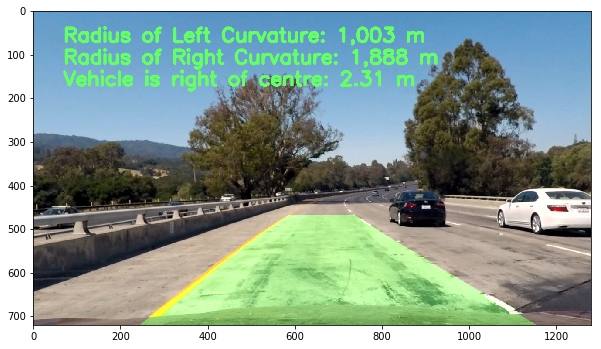

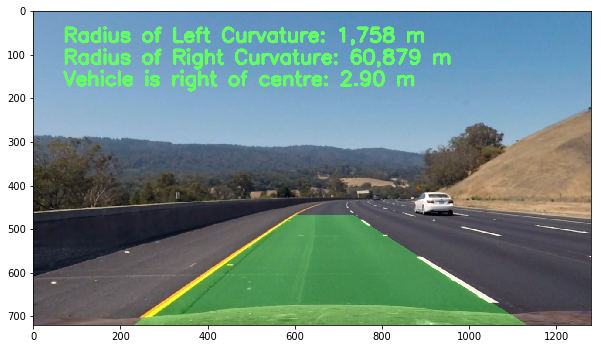

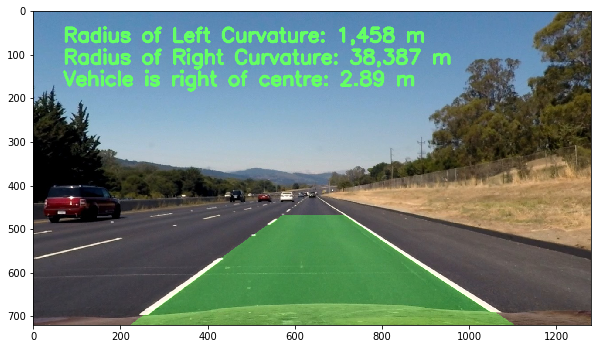

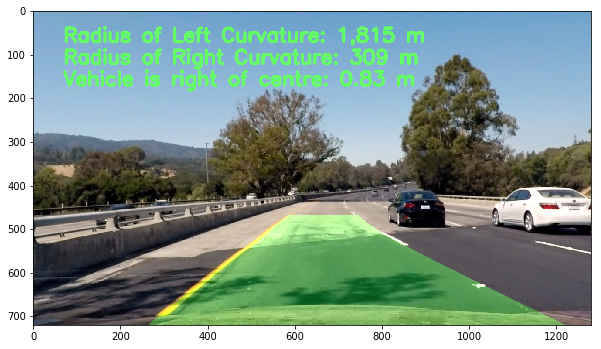

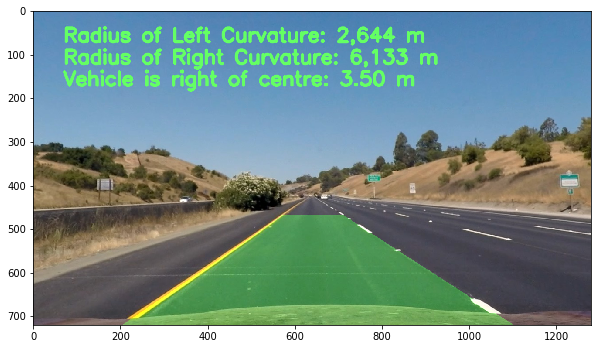

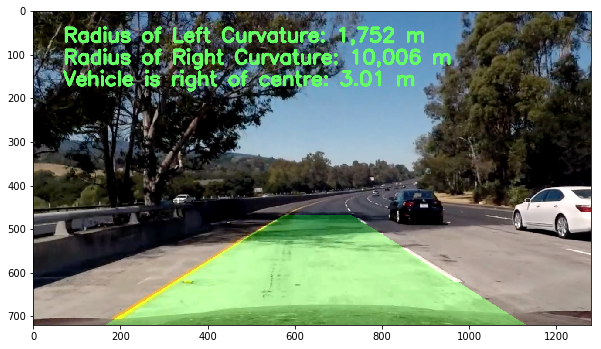

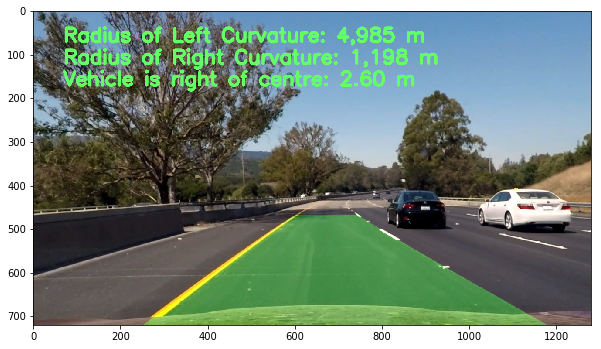

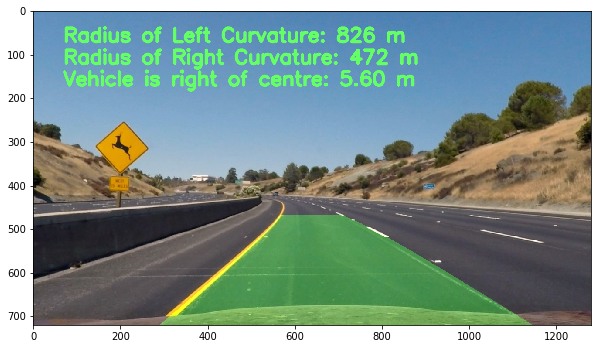

In [31]:
testImgFiles = glob.glob('./test_images/*.jpg')

for _, testImgFile in enumerate(testImgFiles):
    img = cv2.imread(testImgFile)
    
    # undistort image
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    
    # bird's eye view
    birdEye, M, Minv = warp(undistorted)
    birdEyeProcessed = binary_threshold(birdEye,
                                        magIn=(5, (20, 90)), 
                                        dirIn=(15, (0.3, 0.7)),
                                        rgbInR=(225, 255), 
                                        hlsInL=(200, 255))
    
    # find lanes and approximate 2nd degree polynomial
    leftLane, rightLane, leftLaneX, rightLaneX = find_lane_pixels(birdEyeProcessed, visualise=False)
    
    # draw lane onto original undistorted image
    outImg = drawLane(undistorted, birdEyeProcessed, Minv, leftLaneX, rightLaneX)
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(outImg, cv2.COLOR_BGR2RGB))

In [32]:
cv2.imwrite('./output_images/final_output.jpg', outImg)

True

## Test pipeline on Videos

In [1]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [11]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):        
        # was the line detected in the last iteration?
        self.detected = False  
        
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        
        # average x values of the fitted line over the last n iterations
        self.bestx = None    
        
        # polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        
        # polynomial coefficients for the most n recent fits
        self.current_fit = []
        
        # difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        
    def append_new_line(self, lineCoeff, lineX):
        if lineCoeff is None:
            self.detected = False
        else:
            if not(self.best_fit is None):
                self.diffs = abs(lineCoeff - self.best_fit)
                if (self.diffs[0] > 5e-3 or self.diffs[1] > 1 or self.diffs[2] > 5e2) \
                    and len(self.current_fit) > 0:
                    self.detected = False
                else:
                    self.detected = True
                    self.current_fit.append(lineCoeff)
                    self.recent_xfitted.append(lineX)
                    if len(self.current_fit) > 3:
                        self.current_fit = self.current_fit[len(self.current_fit)-3:]
                        self.recent_xfitted = self.recent_xfitted[len(self.recent_xfitted)-3:]
                        
                    self.best_fit = np.average(self.current_fit, axis=0)
                    self.bestx = np.average(self.recent_xfitted, axis=0)
            else:
                self.detected = True
                self.current_fit.append(lineCoeff)
                self.best_fit = lineCoeff
                self.recent_xfitted.append(lineX)
                self.bestx = lineX

In [12]:
prevLeftLane = Line()
prevRightLane = Line()

def pipeline(img):
    imgBGR = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    
    # undistort image
    undistorted = cv2.undistort(imgBGR, mtx, dist, None, mtx)
    
    # bird's eye view
    birdEye, M, Minv = warp(undistorted)
    birdEyeProcessed = binary_threshold(birdEye, 
                                        magIn=(5, (20, 90)), 
                                        dirIn=(15, (0.3, 0.7)),
                                        rgbInR=(225, 255), 
                                        hlsInL=(200, 255))
    
    if (prevLeftLane.detected and prevRightLane.detected):
        leftLane, rightLane, leftLaneX, rightLaneX = search_around_poly(birdEyeProcessed,
                                                                        prevLanes=(prevLeftLane.best_fit, 
                                                                                   prevRightLane.best_fit),
                                                                        margin=30, 
                                                                        visualise=False)
    else:
        leftLane, rightLane, leftLaneX, rightLaneX = find_lane_pixels(birdEyeProcessed, visualise=False)
    
    if not(leftLane is None) and not(rightLane is None):
        prevLeftLane.append_new_line(leftLane, leftLaneX)
        prevRightLane.append_new_line(rightLane, rightLaneX)
    
    # draw lane onto original undistorted image
    outImg = drawLane(undistorted, birdEyeProcessed, Minv, prevLeftLane.bestx, prevRightLane.bestx)

    return cv2.cvtColor(outImg, cv2.COLOR_BGR2RGB)

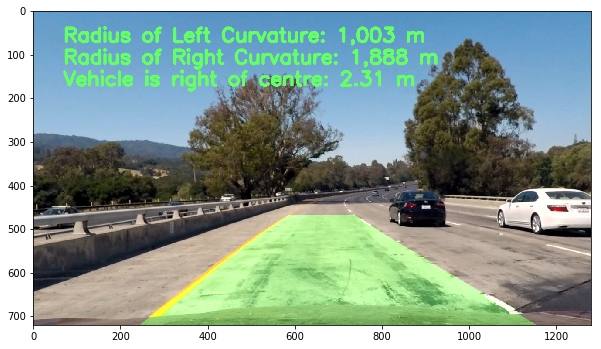

In [72]:
testImgFiles = glob.glob('./test_images/test1.jpg')

for _, testImgFile in enumerate(testImgFiles):
    img = mpimg.imread(testImgFile)
    outImg = pipeline(img)
    plt.figure(figsize=(10, 10))
    plt.imshow(outImg)

In [3]:
# generate gifs output
clip = VideoFileClip('output_videos/project_video_output.mp4').subclip(1, 10).resize(0.3)
clip.write_gif('output_videos/project_video_output.gif')


[MoviePy] Building file output_videos/project_video_output.gif with imageio


100%|█████████▉| 225/226 [00:24<00:00,  8.97it/s]


In [77]:
# test pipeline on project video
output = 'output_videos/project_video_output.mp4'
clip = VideoFileClip('test_videos/project_video.mp4')
projectClip = clip.fl_image(pipeline)
%time projectClip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video output_videos/project_video_output.mp4
[MoviePy] Writing video output_videos/project_video_output.mp4


100%|█████████▉| 1260/1261 [06:35<00:00,  3.22it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/project_video_output.mp4 

CPU times: user 3min 55s, sys: 31.4 s, total: 4min 26s
Wall time: 6min 38s


In [15]:
# FAILED
# test pipeline on challenge video
output = 'output_videos/challenge_video_output.mp4'
clip = VideoFileClip('test_videos/challenge_video.mp4').subclip(0,5)
projectClip = clip.fl_image(pipeline)
%time projectClip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video output_videos/challenge_video_output.mp4
[MoviePy] Writing video output_videos/challenge_video_output.mp4


100%|██████████| 150/150 [00:50<00:00,  2.69it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/challenge_video_output.mp4 

CPU times: user 30.5 s, sys: 6.04 s, total: 36.5 s
Wall time: 53.9 s


In [16]:
# FAILED
# test pipeline on harder challenge video
output = 'output_videos/harder_challenge_video_output.mp4'
clip = VideoFileClip('test_videos/harder_challenge_video.mp4').subclip(0,5)
projectClip = clip.fl_image(pipeline)
%time projectClip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video output_videos/harder_challenge_video_output.mp4
[MoviePy] Writing video output_videos/harder_challenge_video_output.mp4


 99%|█████████▉| 125/126 [00:45<00:00,  2.72it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/harder_challenge_video_output.mp4 

CPU times: user 26.3 s, sys: 5.55 s, total: 31.8 s
Wall time: 49.9 s
